In [ ]:
import numpy as np
import pandas as pd
import seaborn as sns

In [ ]:
df_train = pd.read_csv('/content/train.csv')
df_test = pd.read_csv('/content/test.csv')

In [ ]:
df_train.head()
# df_test.head()

,dates,Factor A,Factor B,Factor C,Factor D,Factor E,Factor F,Factor G,Factor H,Factor I,Factor J,Factor K,Factor L,Factor M,Factor N,TGD Consultancy Share price,TGD Automobiles Share price,TGD Power Share price
0,1700-01-01,502.52,498.78,493.98,947.6,505.24,79050.0,502.10,502.73,630.41,496.60,508.95,512.01,499.20,501.94,519.0,420.0,507.0
1,1700-01-02,503.33,495.09,496.93,928.6,506.21,31082.0,502.28,501.96,630.61,496.76,508.97,512.45,500.14,501.51,518.0,420.0,507.0
2,1700-01-03,500.62,493.71,504.75,935.5,505.51,19375.0,502.09,499.17,630.81,496.91,508.99,513.31,499.96,501.00,523.0,437.0,522.0
3,1700-01-04,502.08,492.98,502.20,923.5,505.25,22010.0,501.88,500.43,631.01,497.06,509.01,513.49,500.05,501.04,522.0,437.0,522.0
4,1700-01-05,502.81,493.23,499.57,918.1,504.86,26533.0,501.70,501.46,631.21,497.21,509.03,513.59,500.31,501.10,522.0,437.0,522.0


In [ ]:
df_train.shape

(161768, 18)

In [ ]:
corr_matrix = df_train.corr()

<ipython-input-40-aaf76e557f3a>:1: FutureWarning:

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.



<Axes: >

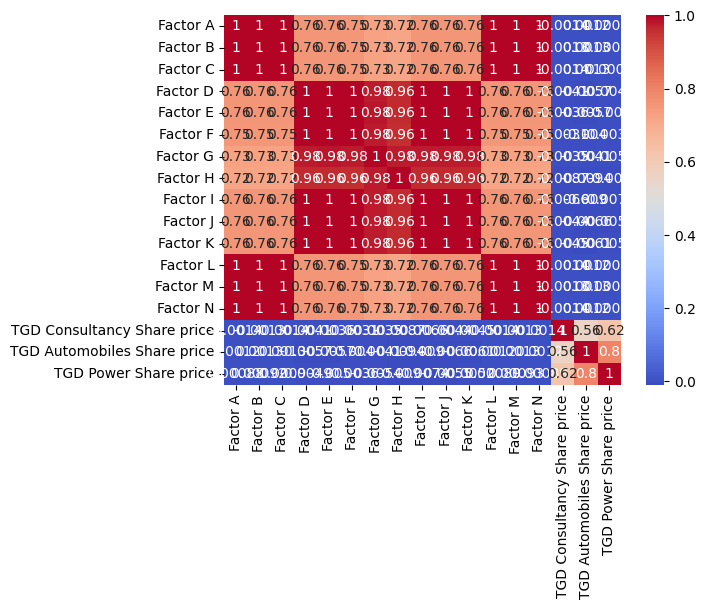

In [ ]:
sns.heatmap(corr_matrix, cmap='coolwarm', annot=True)

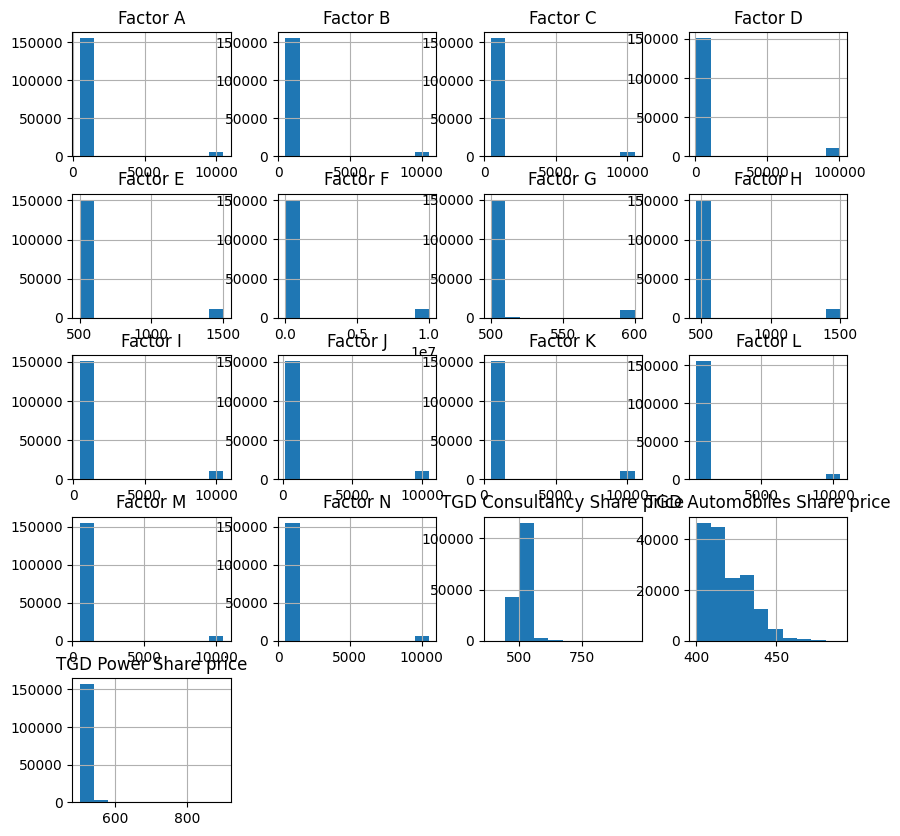

In [ ]:
import matplotlib.pyplot as plt
# plot histograms for numerical columns
df_train.hist(figsize=(10, 10))
plt.show()

In [ ]:
df_train.head()

,dates,Factor A,Factor B,Factor C,Factor D,Factor E,Factor F,Factor G,Factor H,Factor I,Factor J,Factor K,Factor L,Factor M,Factor N,TGD Consultancy Share price,TGD Automobiles Share price,TGD Power Share price
0,1700-01-01,502.52,498.78,493.98,947.6,505.24,79050.0,502.10,502.73,630.41,496.60,508.95,512.01,499.20,501.94,519.0,420.0,507.0
1,1700-01-02,503.33,495.09,496.93,928.6,506.21,31082.0,502.28,501.96,630.61,496.76,508.97,512.45,500.14,501.51,518.0,420.0,507.0
2,1700-01-03,500.62,493.71,504.75,935.5,505.51,19375.0,502.09,499.17,630.81,496.91,508.99,513.31,499.96,501.00,523.0,437.0,522.0
3,1700-01-04,502.08,492.98,502.20,923.5,505.25,22010.0,501.88,500.43,631.01,497.06,509.01,513.49,500.05,501.04,522.0,437.0,522.0
4,1700-01-05,502.81,493.23,499.57,918.1,504.86,26533.0,501.70,501.46,631.21,497.21,509.03,513.59,500.31,501.10,522.0,437.0,522.0


In [ ]:
import plotly.express as px

share_prices = ['TGD Consultancy Share price', 'TGD Automobiles Share price', 'TGD Power Share price']

for share_price in share_prices:
    fig = px.line(df_train, x='dates', y=share_price)
    fig.update_layout(title=share_price)
    fig.show()

In [ ]:
df_train_copy = df_train.copy()
df_train_copy['month'] = pd.DatetimeIndex(df_train_copy['dates']).month
df_train_copy['year'] = pd.DatetimeIndex(df_train_copy['dates']).year
df_train_copy['month_year'] = [str(i)+'-'+str(j) for i,j in zip(df_train_copy.year, df_train_copy.month)]
df_train_copy.head()

,dates,Factor A,Factor B,Factor C,Factor D,Factor E,Factor F,Factor G,Factor H,Factor I,...,Factor K,Factor L,Factor M,Factor N,TGD Consultancy Share price,TGD Automobiles Share price,TGD Power Share price,month,year,month_year
0,1700-01-01,502.52,498.78,493.98,947.6,505.24,79050.0,502.10,502.73,630.41,...,508.95,512.01,499.20,501.94,519.0,420.0,507.0,1,1700,1700-1
1,1700-01-02,503.33,495.09,496.93,928.6,506.21,31082.0,502.28,501.96,630.61,...,508.97,512.45,500.14,501.51,518.0,420.0,507.0,1,1700,1700-1
2,1700-01-03,500.62,493.71,504.75,935.5,505.51,19375.0,502.09,499.17,630.81,...,508.99,513.31,499.96,501.00,523.0,437.0,522.0,1,1700,1700-1
3,1700-01-04,502.08,492.98,502.20,923.5,505.25,22010.0,501.88,500.43,631.01,...,509.01,513.49,500.05,501.04,522.0,437.0,522.0,1,1700,1700-1
4,1700-01-05,502.81,493.23,499.57,918.1,504.86,26533.0,501.70,501.46,631.21,...,509.03,513.59,500.31,501.10,522.0,437.0,522.0,1,1700,1700-1


In [ ]:
df_train_copy = df_train.copy()
df_train_copy['dates'] = pd.to_datetime(df_train_copy['dates'])
df_train_copy['year'] = df_train_copy['dates'].dt.year
df_train_copy['month'] = df_train_copy['dates'].dt.month

df_mean = df_train_copy.groupby(['year','month']).mean().reset_index()
df_cross = df_mean.pivot_table(index='year', columns='month', values='TGD Consultancy Share price')

import plotly.express as px
px.imshow(df_cross, height=700, aspect='auto', color_continuous_scale='viridis')

<ipython-input-47-526423788fc0>:6: FutureWarning:

The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.



In [ ]:
import plotly.graph_objs as go

factors = ['Factor A', 'Factor B', 'Factor C', 'Factor D', 'Factor E', 'Factor F',           'Factor G', 'Factor H', 'Factor I', 'Factor J', 'Factor K', 'Factor L', 'Factor M', 'Factor N']
months = [str(i) for i in list(set(df_train_copy.month))] + ['1']
years = list(set(df_train_copy.year))
pal = list(sns.color_palette(palette='viridis',
                             n_colors=len(years)).as_hex())

fig = go.Figure()
for i,c in zip(years,pal):
    df_year = df_train_copy[df_train_copy['year']==i]
    df_mean = df_year.groupby(['year', 'month']).mean().reset_index()
    df_cross = df_mean.set_index(['year','month'])[factors].unstack()
    val = list(df_cross.values.flatten())*2
    fig.add_trace(go.Scatterpolar(r=val, theta=months,
                                  name=i, marker=dict(color=c)))
fig.update_layout(height=800)

<ipython-input-48-3a4a1cec62f5>:12: FutureWarning:

The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.

<ipython-input-48-3a4a1cec62f5>:12: FutureWarning:

The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.

<ipython-input-48-3a4a1cec62f5>:12: FutureWarning:

The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.

<ipython-input-48-3a4a1cec62f5>:12: FutureWarning:

The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to

In [ ]:
corr_with_output = corr_matrix.iloc[:-3, -3:]
corr_with_output.abs().sort_values(['TGD Consultancy Share price', 'TGD Automobiles Share price', 'TGD Power Share price'], ascending=False)

,TGD Consultancy Share price,TGD Automobiles Share price,TGD Power Share price
Factor H,0.008741,0.009396,0.008990
Factor I,0.006592,0.008951,0.007412
Factor K,0.004469,0.006119,0.005172
Factor J,0.004415,0.006567,0.005510
Factor D,0.004109,0.005747,0.004872
Factor E,0.003627,0.005690,0.005031
Factor G,0.003521,0.004104,0.005370
Factor F,0.003085,0.004044,0.003580
Factor L,0.001388,0.001216,0.000888
Factor A,0.001387,0.001208,0.000882


In [ ]:
df_train.tail()

,dates,Factor A,Factor B,Factor C,Factor D,Factor E,Factor F,Factor G,Factor H,Factor I,Factor J,Factor K,Factor L,Factor M,Factor N,TGD Consultancy Share price,TGD Automobiles Share price,TGD Power Share price
161763,2142-11-23,10499.99,10499.99,10499.99,100499.9,1499.99,10000500.0,599.99,1499.99,10499.99,10499.99,10499.99,10499.99,10499.99,10499.99,498.0,420.0,507.0
161764,2142-11-24,10499.99,10499.99,10499.99,100499.9,1499.99,10000500.0,599.99,1499.99,10499.99,10499.99,10499.99,10499.99,10499.99,10499.99,502.0,420.0,507.0
161765,2142-11-25,10499.99,10499.99,10499.99,100499.9,1499.99,10000500.0,599.99,1499.99,10499.99,10499.99,10499.99,10499.99,10499.99,10499.99,508.0,420.0,507.0
161766,2142-11-26,10499.99,10499.99,10499.99,100499.9,1499.99,10000500.0,599.99,1499.99,10499.99,10499.99,10499.99,10499.99,10499.99,10499.99,507.0,420.0,507.0
161767,2142-11-27,10499.99,10499.99,10499.99,100499.9,1499.99,10000500.0,599.99,1499.99,10499.99,10499.99,10499.99,10499.99,10499.99,10499.99,499.0,420.0,507.0
